# YOLOv8을 활용한 객체검출

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 14.7 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/object detection datasets/citydata')
# 현재 경로 확인
print("Current working directory:", os.getcwd())

# 파일 및 폴더 확인
print("Files and directories in current path:", os.listdir())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current working directory: /content/drive/MyDrive/object detection datasets/citydata
Files and directories in current path: ['image_dataset.zip', 'yolov8n.pt', 'runs', 'finemodel', '.ipynb_checkpoints', 'yolo11n.pt', 'dataset.yaml', 'annotation', 'camera_image', 'yolo_label', 'dataset']


## 데이터 전처리

zip 파일을 압축 해제하고, json파일을 txt로, 그 다음 훈련 세트와 검증 세트로 데이터를 분할하자.

In [ ]:
import zipfile
import os

# ZIP 파일 경로와 출력 폴더 설정
zip_file_path = "/content/drive/MyDrive/object detection datasets/citydata/image_dataset.zip"
output_dir = "/content/drive/MyDrive/object detection datasets/citydata/"

# 압축 해제
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print(f"압축 해제 완료! 파일이 '{output_dir}'에 저장되었습니다.")


압축 해제 완료! 파일이 '/content/drive/MyDrive/object detection datasets/citydata/'에 저장되었습니다.


In [ ]:
import re


image_dir = os.path.join(output_dir, "camera_image")

# 이미지 이름 정리 함수
def add_fr_to_images(image_dir):
    for file_name in os.listdir(image_dir):
        if file_name.endswith((".jpg", ".png", ".jpeg")) and "Fr" not in file_name and "Re" not in file_name:
            match = re.search(r"CityData_(\d{4}-\d{2}-\d{2}-\d{2}-\d{2}-\d{2}_\d{2}_\d{4})", file_name)
            if match:
                new_name = f"CityData_Fr_{match.group(1)}{os.path.splitext(file_name)[1]}"
                os.rename(os.path.join(image_dir, file_name), os.path.join(image_dir, new_name))
                print(f"Renamed: {file_name} -> {new_name}")

add_fr_to_images(image_dir)
print("이미지 파일 이름 정리 완료!")


Renamed: CityData_2022-10-25-10-06-47_21_0000.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0000.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0001.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0001.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0002.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0002.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0003.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0003.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0004.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0004.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0005.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0005.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0006.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0006.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0007.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0007.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0008.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0008.jpg
Renamed: CityData_2022-10-25-10-06-47_21_0009.jpg -> CityData_Fr_2022-10-25-10-06-47_21_0009.jpg
Renamed: CityData_2022-10-25-1

In [ ]:
import json

# JSON 파일 경로와 출력 폴더 설정
json_dir = os.path.join(output_dir, "annotation")
txt_output_dir = os.path.join(output_dir, "yolo_label")
os.makedirs(txt_output_dir, exist_ok=True)

# YOLO 포맷 변환 함수
def convert_to_yolo(json_file, txt_output_dir):
    with open(json_file, 'r') as f:
        data = json.load(f)

    for image in data["images"]:
        image_id = image["id"]
        file_name = os.path.splitext(image["file_name"])[0]
        width, height = image["width"], image["height"]

        # YOLO 라벨 파일 작성
        label_file = os.path.join(txt_output_dir, f"{file_name}.txt")
        with open(label_file, 'w') as label_f:
            for annotation in data["annotations"]:
                if annotation["image_id"] == image_id:
                    category_id = annotation["category_id"] - 1  # YOLO는 0부터 시작
                    bbox = annotation["bbox"]
                    x_center = (bbox[0] + bbox[2] / 2) / width
                    y_center = (bbox[1] + bbox[3] / 2) / height
                    bbox_width = bbox[2] / width
                    bbox_height = bbox[3] / height

                    # YOLO 형식: class x_center y_center width height
                    label_f.write(f"{category_id} {x_center} {y_center} {bbox_width} {bbox_height}\n")

# 모든 JSON 파일 변환
for file in os.listdir(json_dir):
    if file.endswith(".json"):
        json_file_path = os.path.join(json_dir, file)
        convert_to_yolo(json_file_path, txt_output_dir)

print("JSON -> YOLO 포맷 변환 완료!")


JSON -> YOLO 포맷 변환 완료!


In [ ]:
import os

# 경로 설정
image_dir = "/content/drive/MyDrive/object detection datasets/citydata/camera_image"
label_dir = "/content/drive/MyDrive/object detection datasets/citydata/yolo_label"

# 파일 키 생성 함수
def extract_key(filename):
    return os.path.splitext(filename)[0]  # 파일 확장자를 제외한 이름 반환

# 이미지와 라벨 키 수집
image_keys = {extract_key(file) for file in os.listdir(image_dir) if file.endswith((".jpg", ".jpeg", ".png"))}
label_keys = {extract_key(file) for file in os.listdir(label_dir) if file.endswith(".txt")}

# 라벨이 없는 이미지 찾기
images_without_labels = image_keys - label_keys

# 삭제
deleted_files = []
for image_key in images_without_labels:
    image_path = os.path.join(image_dir, image_key + ".jpg")  # 확장자가 jpg인 경우
    if os.path.exists(image_path):
        os.remove(image_path)
        deleted_files.append(image_path)

# 결과 출력
print(f"삭제된 이미지 파일 수: {len(deleted_files)}")
if deleted_files:
    print("\n삭제된 파일 리스트:")
    for file in deleted_files:
        print(file)


삭제된 이미지 파일 수: 1196

삭제된 파일 리스트:
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Fr_2022-10-25-10-05-15_19_0242.jpg
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Fr_2022-10-25-09-59-56_12_0078.jpg
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Fr_2022-10-25-10-02-13_15_0384.jpg
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Re_2022-10-25-09-58-25_10_0128.jpg
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Fr_2022-10-25-10-06-47_21_0344.jpg
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Fr_2022-10-25-10-06-47_21_0352.jpg
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Re_2022-10-25-10-07-32_22_0394.jpg
/content/drive/MyDrive/object detection datasets/citydata/camera_image/CityData_Fr_2022-10-25-09-59-56_12_0036.jpg
/content/drive/MyDrive/object detection datasets

In [ ]:
image_keys = set()
label_keys = set()

for file in os.listdir('/content/drive/MyDrive/object detection datasets/citydata/camera_image'):
    key = os.path.splitext(file)[0]
    image_keys.add(key)

for file in os.listdir('/content/drive/MyDrive/object detection datasets/citydata/yolo_label'):
    key = os.path.splitext(file)[0]
    label_keys.add(key)

# 비교 결과 출력
only_images = image_keys - label_keys
only_labels = label_keys - image_keys

print(f"이미지 파일: {len(image_keys)}개")
print(f"라벨 파일: {len(label_keys)}개")
print(f"일치하는 파일: {len(image_keys & label_keys)}개")

if only_images:
    print(f"라벨 없는 이미지 파일: {len(only_images)}개")
    print("\n".join(only_images))
if only_labels:
    print(f"이미지 없는 라벨 파일: {len(only_labels)}개")
    print("\n".join(only_labels))


이미지 파일: 10009개
라벨 파일: 10009개
일치하는 파일: 10009개


In [ ]:
import shutil

# 원본 디렉토리와 대상 디렉토리
src_dir = ["camera_image", "yolo_label"]
dst_dir = "dataset"

# 디렉토리 이동
for src in src_dir:
    shutil.move(src, dst_dir)

### 데이터셋 분할

In [ ]:
from ultralytics.data.utils import autosplit

autosplit(
    path = "dataset",
    weights=(0.7, 0.2, 0.1)
)
print("Dataset split and move complete.")

Autosplitting images from dataset


100%|██████████| 10009/10009 [01:02<00:00, 161.18it/s]

Dataset split and move complete.


In [ ]:
def count_lines_in_file(txt_file):
    """
    TXT 파일의 줄 수를 계산.

    Args:
        txt_file (str): TXT 파일 경로.

    Returns:
        int: 파일의 총 줄 수.
    """
    try:
        with open(txt_file, "r") as file:
            return sum(1 for _ in file)
    except FileNotFoundError:
        print(f"File {txt_file} not found.")
        return 0

print(f"train_images 개수: {count_lines_in_file('/content/drive/MyDrive/object detection datasets/citydata/autosplit_train.txt')}")
print(f"val_images 개수: {count_lines_in_file('/content/drive/MyDrive/object detection datasets/citydata/autosplit_val.txt')}")
print(f"test_images 개수: {count_lines_in_file('/content/drive/MyDrive/object detection datasets/citydata/autosplit_test.txt')}")

train_images 개수: 7005
val_images 개수: 2047
test_images 개수: 957


In [ ]:
import os
from collections import Counter

def count_labels_from_txt(txt_file, dataset_root):
    """
    autosplit TXT 파일에서 레이블 총 개수와 클래스별 개수를 계산.

    Args:
        txt_file (str): autosplit TXT 파일 경로.
        dataset_root (str): 데이터셋의 루트 디렉토리 경로.

    Returns:
        tuple: 총 레이블 개수, 클래스별 개수 (Counter 객체)
    """
    total_labels = 0
    class_counts = Counter()

    if not os.path.exists(txt_file):
        print(f"TXT file {txt_file} does not exist.")
        return total_labels, class_counts

    with open(txt_file, "r") as file:
        lines = file.readlines()
        for line in lines:
            image_path = os.path.join(dataset_root, line.strip().lstrip("./"))  # 이미지 절대 경로 변환
            label_path = image_path.replace("/camera_image/", "/labels/").replace(".jpg", ".txt")

            # 라벨 파일이 존재하면 클래스 정보 추출
            if os.path.exists(label_path):
                with open(label_path, "r") as label_file:
                    for label_line in label_file:
                        class_id = int(label_line.split()[0])  # 클래스 ID 추출
                        class_counts[class_id] += 1
                        total_labels += 1

    return total_labels, class_counts


# autosplit TXT 파일 경로
txt_files = {
    "Train": "/content/drive/MyDrive/object detection datasets/citydata/autosplit_train.txt",
    "Validation": "/content/drive/MyDrive/object detection datasets/citydata/autosplit_val.txt",
    "Test": "/content/drive/MyDrive/object detection datasets/citydata/autosplit_test.txt",
}

# 데이터셋 루트 디렉토리
dataset_root = "/content/drive/MyDrive/object detection datasets/citydata"

# 결과 출력
for subset, txt_file in txt_files.items():
    total_labels, class_counts = count_labels_from_txt(txt_file, dataset_root)
    print(f"{subset}:")
    print(f"  Total Labels: {total_labels}")
    print(f"  Class Counts: {dict(sorted(class_counts.items()))}")


Train:
  Total Labels: 71346
  Class Counts: {2: 17836, 0: 45245, 7: 832, 1: 5002, 10: 2137, 8: 106, 4: 50, 5: 42, 3: 28, 6: 53, 9: 15}
Validation:
  Total Labels: 21124
  Class Counts: {2: 5288, 0: 13297, 7: 238, 1: 1538, 10: 683, 8: 26, 4: 14, 5: 12, 3: 11, 6: 13, 9: 4}
Test:
  Total Labels: 10150
  Class Counts: {2: 2469, 0: 6486, 7: 120, 10: 314, 1: 720, 8: 19, 4: 4, 3: 7, 6: 6, 5: 2, 9: 3}


In [ ]:
class_count = [
    {2: 17836, 0: 45245, 7: 832, 1: 5002, 10: 2137, 8: 106, 4: 50, 5: 42, 3: 28, 6: 53, 9: 15},
    {2: 5288, 0: 13297, 7: 238, 1: 1538, 10: 683, 8: 26, 4: 14, 5: 12, 3: 11, 6: 13, 9: 4},
    {2: 2469, 0: 6486, 7: 120, 10: 314, 1: 720, 8: 19, 4: 4, 3: 7, 6: 6, 5: 2, 9: 3}]

total_labels = [71346, 21124, 10150]

name = ['Train', 'Validation', 'Test']

sorted_class_counts = [dict(sorted(d.items())) for d in class_count]

for i, (j, sorted_dict) in zip(range(3), enumerate(sorted_class_counts, 1)):
    print(f"{name[i]}:")
    print(f"Total Labels: {total_labels[i]}")
    print(f"Dataset {j}: {sorted_dict}")
    print()

Train:
Total Labels: 71346
Dataset 1: {0: 45245, 1: 5002, 2: 17836, 3: 28, 4: 50, 5: 42, 6: 53, 7: 832, 8: 106, 9: 15, 10: 2137}

Validation:
Total Labels: 21124
Dataset 2: {0: 13297, 1: 1538, 2: 5288, 3: 11, 4: 14, 5: 12, 6: 13, 7: 238, 8: 26, 9: 4, 10: 683}

Test:
Total Labels: 10150
Dataset 3: {0: 6486, 1: 720, 2: 2469, 3: 7, 4: 4, 5: 2, 6: 6, 7: 120, 8: 19, 9: 3, 10: 314}



### yaml 생성

In [ ]:
yaml_content = """
path: /content/drive/MyDrive/object detection datasets/citydata/dataset
train: /content/drive/MyDrive/object detection datasets/citydata/autosplit_train.txt
val: /content/drive/MyDrive/object detection datasets/citydata/autosplit_val.txt
test: /content/drive/MyDrive/object detection datasets/citydata/autosplit_test.txt

names:
  0: Automobile
  1: Bus
  2: Truck
  3: PoliceCar
  4: Ambulance
  5: SchoolBus
  6: OtherCar
  7: Motorcycle
  8: Bicycle
  9: TwoWheeler
  10: Pedestrian
"""

# yaml 파일 저장
yaml_path = "/content/drive/MyDrive/object detection datasets/citydata/dataset.yaml"
with open(yaml_path, "w") as file:
    file.write(yaml_content)

print(f"yaml 파일 저장 완료: {yaml_path}")


yaml 파일 저장 완료: /content/drive/MyDrive/object detection datasets/citydata/dataset.yaml


## 기본 YOLOv8으로 객체 검출하기

In [ ]:
from ultralytics import YOLO
import yaml

# 모델 로드
model = YOLO("yolov8n.pt")

In [ ]:
# Validation 데이터 성능 측정
val_results = model.val(
    data="/content/drive/MyDrive/object detection datasets/citydata/dataset.yaml",
    classes=list(range(11)),
    conf=0.25,
    save_dir='/content/drive/MyDrive/object detection datasets/citydata/runs')

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 139MB/s]
val: Scanning /content/drive/MyDrive/object detection datasets/citydata/dataset/labels... 2047 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2047/2047 [00:09<00:00, 219.86it/s]


val: New cache created: /content/drive/MyDrive/object detection datasets/citydata/dataset/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [00:15<00:00,  8.33it/s]


                   all       2047      21943      0.043      0.035     0.0232     0.0173
                person       2021      13821     0.0158   0.000217    0.00795    0.00583
               bicycle        888       1560          0          0          0          0
                   car       2018       5550      0.122        0.3     0.0797     0.0503
            motorcycle         10         14          0          0          0          0
              airplane         14         14          0          0          0          0
                   bus         12         12   0.000983     0.0833   0.000606   0.000545
                 train          9         13          0          0          0          0
                 truck        234        241          0          0          0          0
                  boat         26         26          0          0          0          0
         traffic light          4          4          0          0          0          0
          fire hydran

In [ ]:
print(val_results)

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d277b7b32e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Fr_2022-10-25-10-07-32_22_0262.jpg: 480x640 10 cars, 1 truck, 1 traffic light, 57.6ms
Speed: 3.3ms preprocess, 57.6ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


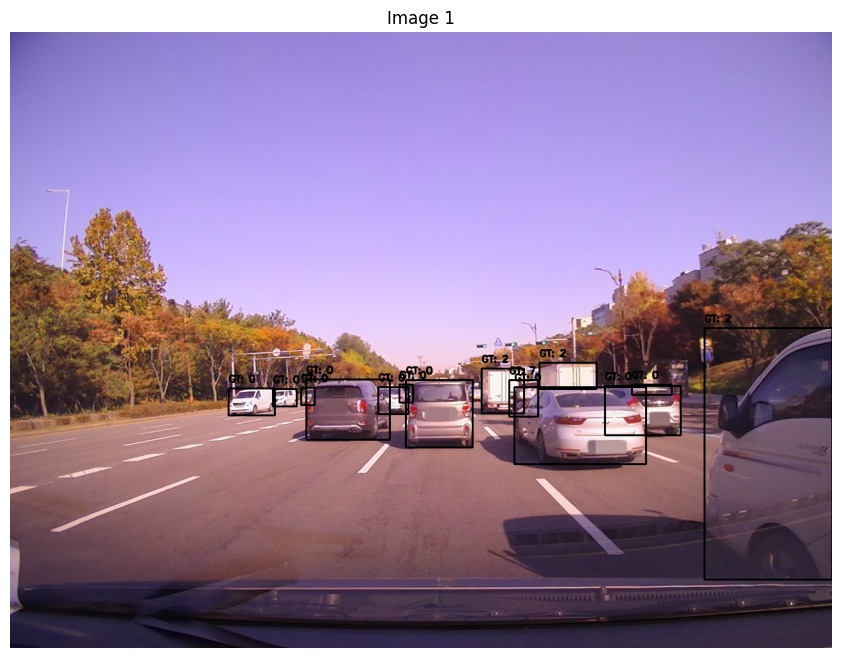


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Re_2022-10-25-09-59-56_12_0137.jpg: 480x640 8 cars, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


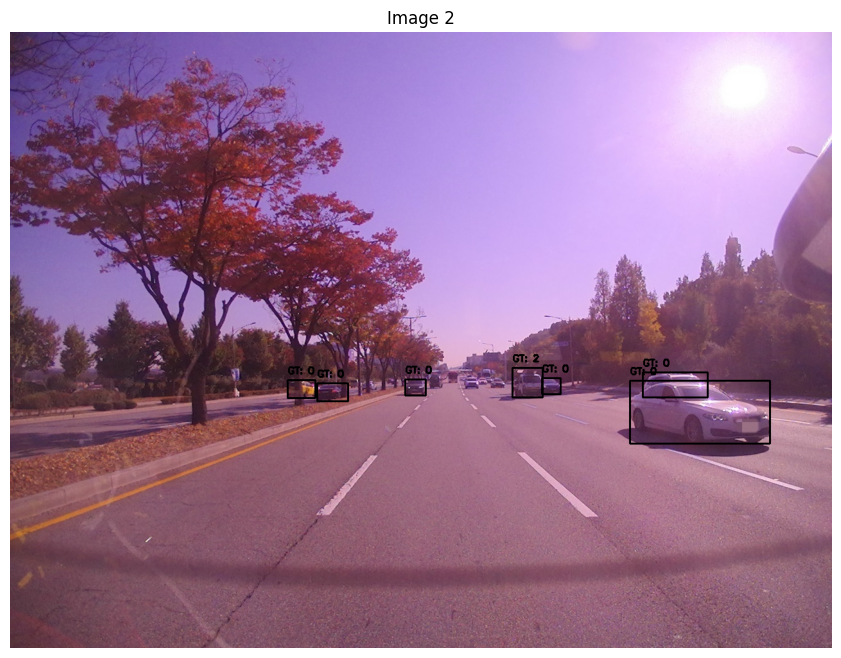


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Re_2022-10-25-10-06-01_20_0083.jpg: 480x640 7 cars, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


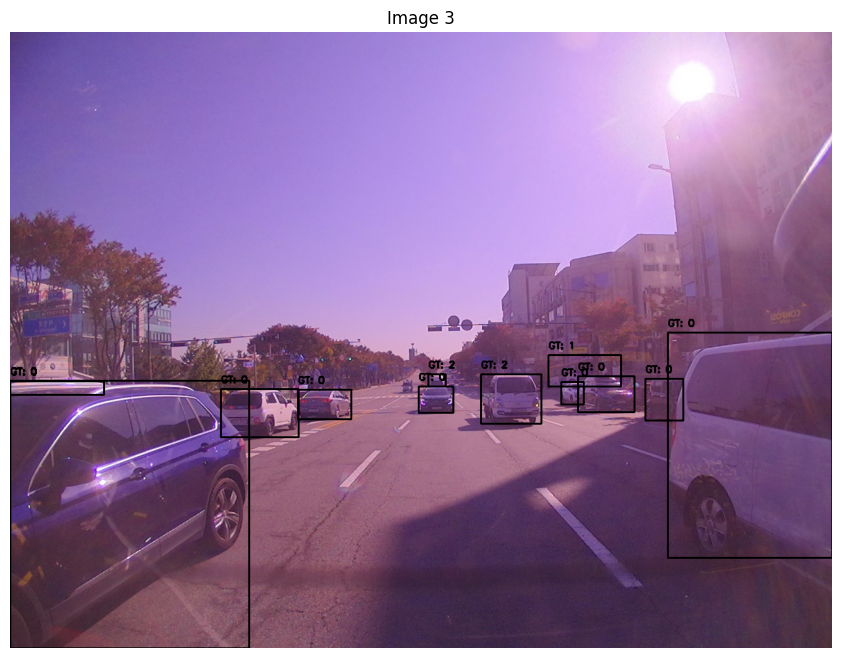


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Re_2022-10-25-10-06-01_20_0070.jpg: 480x640 7 cars, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


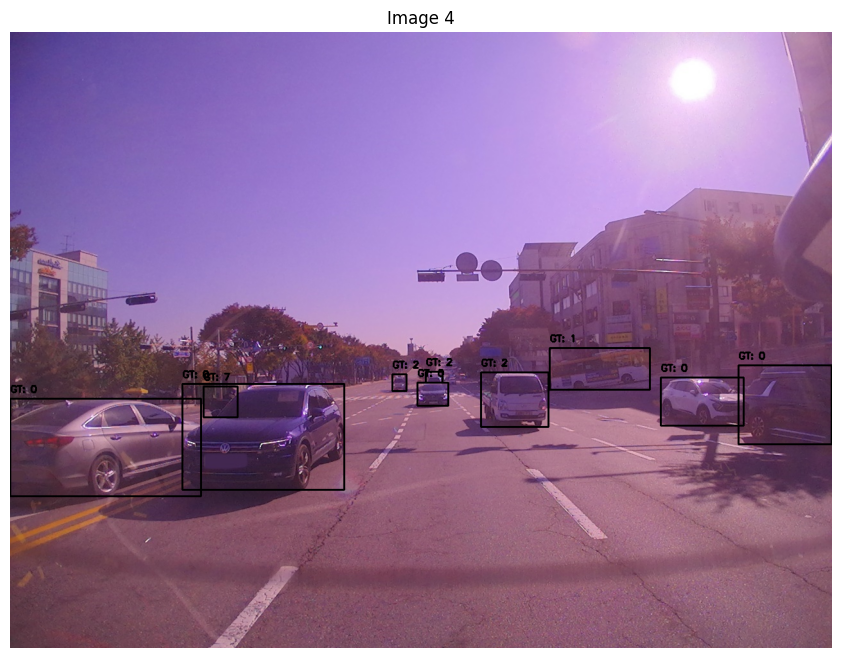


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Re_2022-10-25-10-06-01_20_0334.jpg: 480x640 8 cars, 2 trucks, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


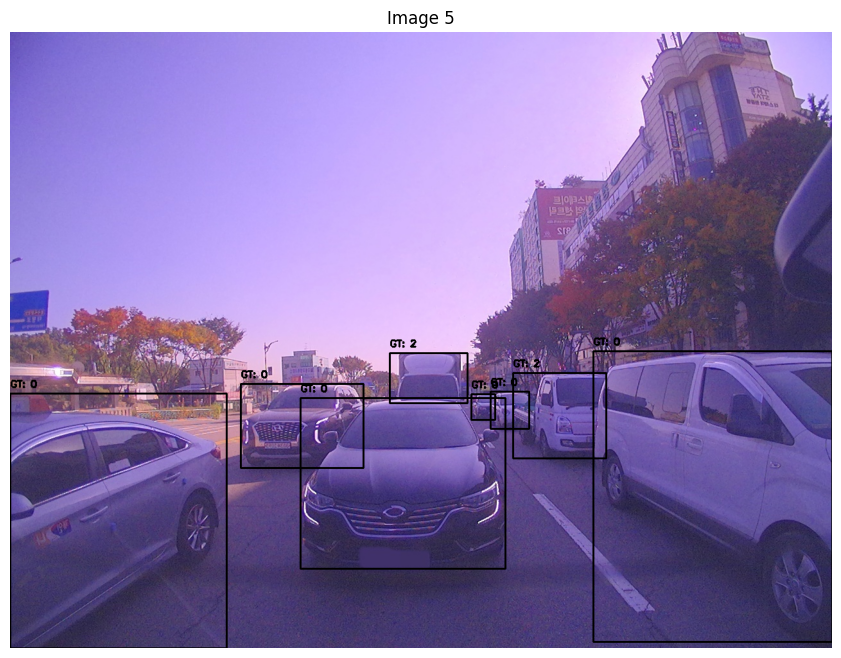


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Fr_2022-10-25-09-58-25_10_0017.jpg: 480x640 2 cars, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


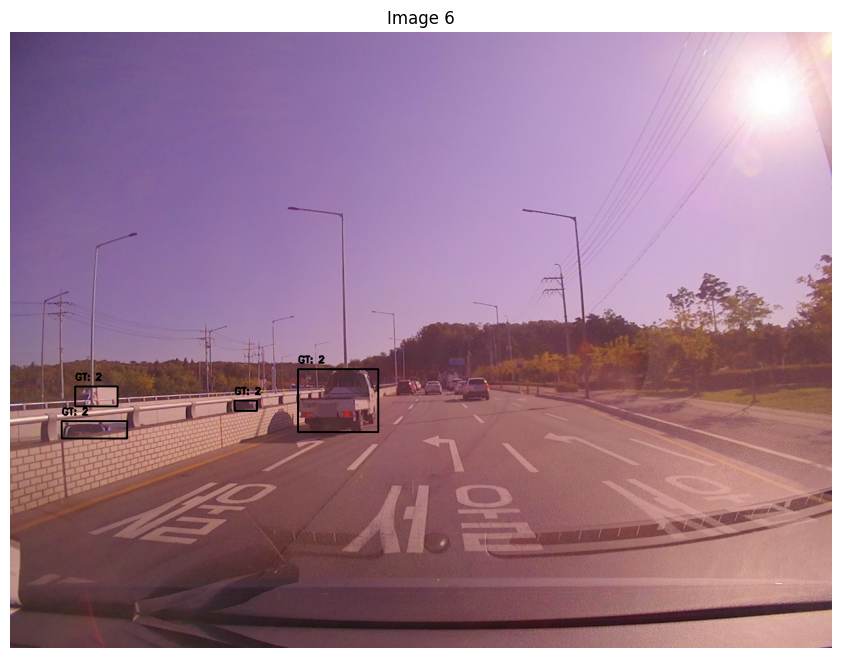

In [ ]:
import cv2
import matplotlib.pyplot as plt

def load_gt_from_txt(txt_path, image_width, image_height):
    """
    YOLO 포맷의 Ground Truth 데이터를 읽어서 절대 좌표로 변환.
    :param txt_path: TXT 파일 경로
    :param image_width: 이미지 너비
    :param image_height: 이미지 높이
    :return: [(x1, y1, x2, y2, class_id), ...] 형태의 리스트
    """
    gt_boxes = []
    if not os.path.exists(txt_path):
        print(f"GT file not found: {txt_path}")
        return gt_boxes  # 빈 리스트 반환

    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            x1 = int((x_center - width / 2) * image_width)
            y1 = int((y_center - height / 2) * image_height)
            x2 = int((x_center + width / 2) * image_width)
            y2 = int((y_center + height / 2) * image_height)
            gt_boxes.append((x1, y1, x2, y2, int(class_id)))
    return gt_boxes

def visualize_gt_and_predictions(image_path, gt_boxes, result):
    """
    GT와 예측을 함께 시각화
    :param image_path: 이미지 파일 경로
    :param gt_boxes: Ground Truth 바운딩 박스 리스트 [(x1, y1, x2, y2, class_id), ...]
    :param result: YOLOv8 모델의 예측 결과 객체
    :return: 시각화된 이미지
    """
    img = cv2.imread(image_path)

    # Ground Truth 바운딩 박스 시각화
    for gt_box in gt_boxes:
        x1, y1, x2, y2, gt_label = map(int, gt_box)
        color = (0, 0, 0)  # 검정색
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        cv2.putText(img, f"GT: {gt_label}",
                    (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # 모델 예측 바운딩 박스 시각화
    if result.boxes.xyxy is not None:  # 예측 결과가 있는 경우
        for box in result.boxes.xyxy:
            if len(box) < 6:
                continue

            x1, y1, x2, y2 = map(int, box[:4])
            confidence = box[4].item()  # confidence score
            pred_label = int(box[5].item())  # 예측 클래스 라벨

            # 클래스별 색상 가져오기
            color = class_colors[pred_label]
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img, f"Pred: {pred_label}, Conf: {confidence:.2f}",
                        (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return img

# 경로에서 랜덤으로 이미지 선택
test_images_dir = '/content/drive/MyDrive/object detection datasets/citydata/dataset/images/test'
test_images = random.sample(os.listdir(test_images_dir), 6)   # 6장

for idx, image_file in enumerate(test_images, 1):
    # 이미지 경로
    image_path = os.path.join(test_images_dir, image_file)

    # GT 경로 (확장자를 .txt로 변경하여 다른 디렉토리에서 찾음)
    txt_file = os.path.splitext(image_file)[0] + ".txt"  # 파일 이름 동일, 확장자만 .txt
    txt_path = os.path.join('/content/drive/MyDrive/object detection datasets/citydata/dataset/labels/test', txt_file)

    # 이미지 크기 가져오기
    image = cv2.imread(image_path)
    image_height, image_width = image.shape[:2]

    # GT 로드
    gt_boxes = load_gt_from_txt(txt_path, image_width, image_height)

    # 모델 예측 결과
    result = model.predict(source=image_path, save=False)[0]

    # 시각화된 이미지 반환 (GT + 예측)
    result_img = visualize_gt_and_predictions(image_path, gt_boxes, result)

    # 개별적으로 큰 이미지 출력
    plt.figure(figsize=(12, 8))  # 큰 이미지 크기 설정
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")  # 축 제거
    plt.title(f"Image {idx}")  # 제목 추가
    plt.show()


## 전이학습

In [ ]:
fine_model = YOLO('yolov8n.pt')

In [ ]:
# 전이학습 시작
fine_model.train(
    data="/content/drive/MyDrive/object detection datasets/citydata/dataset.yaml",  # 데이터셋 yaml 경로
    epochs=100,                     # 학습 epoch 수
    batch=64,                      # 배치 크기
    workers=16,
    imgsz=640,                     # 이미지 크기 (가로, 세로)
    optimizer="Adam",              # 옵티마이저 (옵션: 'SGD', 'Adam')
    pretrained=True,               # 사전 학습된 가중치 사용
    project="/content/drive/MyDrive/object detection datasets/citydata/finemodel",    # 결과 저장 경로
    name="custom_yolo",            # 저장 폴더 이름
    verbose=True                   # 학습 중 로그 출력
)


Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/object detection datasets/citydata/dataset.yaml, epochs=100, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=16, project=/content/drive/MyDrive/object detection datasets/citydata/finemodel, name=custom_yolo, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=Non

train: Scanning /content/drive/MyDrive/object detection datasets/citydata/dataset/labels/train... 7006 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7006/7006 [09:51<00:00, 11.85it/s]


train: New cache created: /content/drive/MyDrive/object detection datasets/citydata/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/object detection datasets/citydata/dataset/labels/val.cache... 2001 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2001/2001 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/object detection datasets/citydata/finemodel/custom_yolo/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 12 dataloader workers
Logging results to /content/drive/MyDrive/object detection datasets/citydata/finemodel/custom_yolo
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.91G      1.088      1.339          1        581        640: 100%|██████████| 110/110 [00:42<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]

                   all       2001      21482      0.455     0.0605     0.0547     0.0317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.92G      1.021     0.8138     0.9876        594        640: 100%|██████████| 110/110 [00:35<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.60it/s]


                   all       2001      21482       0.25      0.118     0.0985     0.0574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.88G     0.9947      0.764     0.9834        476        640: 100%|██████████| 110/110 [00:34<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.66it/s]


                   all       2001      21482      0.639      0.131      0.148     0.0891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      9.12G     0.9566     0.7213      0.972        580        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.64it/s]


                   all       2001      21482      0.443      0.154      0.189      0.116

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      9.01G     0.9114     0.6766     0.9594        578        640: 100%|██████████| 110/110 [00:34<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]


                   all       2001      21482      0.787      0.237      0.292      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.98G     0.8757     0.6383     0.9461        555        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.67it/s]


                   all       2001      21482      0.795      0.246      0.297      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      9.14G     0.8559     0.6189     0.9414        493        640: 100%|██████████| 110/110 [00:35<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]

                   all       2001      21482       0.77      0.294      0.357      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.91G     0.8439     0.6077     0.9382        539        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482      0.739      0.303      0.359      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       8.9G     0.8365     0.6012     0.9363        679        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.66it/s]


                   all       2001      21482      0.762       0.35      0.428      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.97G      0.832     0.5968     0.9366        565        640: 100%|██████████| 110/110 [00:35<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.66it/s]


                   all       2001      21482      0.803      0.282      0.339      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      9.07G     0.8161     0.5773     0.9296        591        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]


                   all       2001      21482      0.833      0.304      0.403      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      9.16G     0.8134     0.5792     0.9279        680        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]


                   all       2001      21482      0.723      0.343      0.431      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.86G     0.8066     0.5684     0.9284        410        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]


                   all       2001      21482      0.764      0.291      0.393      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.68G     0.8048     0.5683     0.9268        597        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482      0.677      0.347       0.42      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.99G     0.8024     0.5631     0.9272        503        640: 100%|██████████| 110/110 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]


                   all       2001      21482       0.79       0.38      0.429      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      9.18G     0.7982      0.558      0.926        635        640: 100%|██████████| 110/110 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]


                   all       2001      21482      0.514      0.396      0.447      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100       8.9G     0.7911     0.5556     0.9241        506        640: 100%|██████████| 110/110 [00:36<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]


                   all       2001      21482      0.721      0.428      0.459      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      9.13G     0.7839      0.545     0.9221        583        640: 100%|██████████| 110/110 [00:35<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]


                   all       2001      21482      0.838      0.373      0.462      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.92G     0.7871      0.549     0.9219        523        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482      0.867      0.372      0.447      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.98G     0.7818     0.5442     0.9226        599        640: 100%|██████████| 110/110 [00:36<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]


                   all       2001      21482      0.648      0.392      0.433      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.93G     0.7743     0.5361     0.9187        706        640: 100%|██████████| 110/110 [00:35<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]


                   all       2001      21482      0.568      0.434      0.486      0.363

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.96G     0.7745     0.5405     0.9209        673        640: 100%|██████████| 110/110 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]


                   all       2001      21482      0.677      0.388      0.457       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.98G     0.7757     0.5363     0.9195        497        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482      0.515      0.436      0.456      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.95G      0.772     0.5356     0.9191        484        640: 100%|██████████| 110/110 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]


                   all       2001      21482      0.859      0.407      0.513      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      9.06G     0.7675      0.531     0.9175        420        640: 100%|██████████| 110/110 [00:35<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]


                   all       2001      21482      0.757      0.496      0.535      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.99G     0.7627     0.5253     0.9159        596        640: 100%|██████████| 110/110 [00:36<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]


                   all       2001      21482      0.728      0.469      0.522      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      9.12G     0.7637     0.5248     0.9192        471        640: 100%|██████████| 110/110 [00:35<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]


                   all       2001      21482      0.633       0.44      0.533      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.96G     0.7601     0.5245     0.9156        619        640: 100%|██████████| 110/110 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]


                   all       2001      21482      0.732      0.395      0.509      0.379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       8.9G      0.755     0.5164     0.9159        560        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482       0.73      0.506      0.575      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.96G      0.753     0.5162      0.915        484        640: 100%|██████████| 110/110 [00:36<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]


                   all       2001      21482      0.928      0.407      0.533      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.99G     0.7477     0.5113     0.9118        610        640: 100%|██████████| 110/110 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482      0.724      0.495      0.557       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      9.05G     0.7453     0.5082     0.9128        498        640: 100%|██████████| 110/110 [00:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]


                   all       2001      21482      0.744      0.427      0.507      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.86G     0.7508     0.5114     0.9132        596        640: 100%|██████████| 110/110 [00:36<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]


                   all       2001      21482      0.777      0.498       0.52      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.95G     0.7469     0.5072     0.9151        471        640: 100%|██████████| 110/110 [00:35<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]


                   all       2001      21482      0.858      0.424      0.557      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      9.16G     0.7478     0.5075     0.9123        537        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]

                   all       2001      21482      0.667      0.484      0.561      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      9.17G     0.7433     0.5021     0.9119        488        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]


                   all       2001      21482      0.859      0.483      0.586      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      9.04G     0.7419     0.5033     0.9116        513        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]

                   all       2001      21482      0.801      0.465      0.573      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.91G     0.7371     0.4997     0.9096        503        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]


                   all       2001      21482      0.686      0.525      0.533      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         9G     0.7368     0.4999     0.9077        535        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482      0.713      0.575      0.604      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      9.12G     0.7382     0.4975     0.9093        429        640: 100%|██████████| 110/110 [00:35<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]


                   all       2001      21482      0.647      0.497      0.565      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.96G     0.7331     0.4933     0.9092        560        640: 100%|██████████| 110/110 [00:37<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]


                   all       2001      21482      0.783      0.493      0.568      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      9.09G     0.7316      0.494     0.9073        466        640: 100%|██████████| 110/110 [00:35<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]


                   all       2001      21482       0.83      0.463      0.573      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         9G     0.7299     0.4888     0.9073        541        640: 100%|██████████| 110/110 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]


                   all       2001      21482        0.8       0.45      0.567      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       8.9G      0.724     0.4892     0.9051        481        640: 100%|██████████| 110/110 [00:37<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]


                   all       2001      21482      0.604       0.49      0.584      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.87G     0.7208     0.4864      0.904        579        640: 100%|██████████| 110/110 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]


                   all       2001      21482      0.737      0.564      0.603      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.95G      0.716      0.481     0.9055        410        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]


                   all       2001      21482       0.76      0.557      0.629       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      9.03G     0.7157     0.4782     0.9019        565        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.786      0.525      0.632      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.93G     0.7155     0.4755     0.9028        537        640: 100%|██████████| 110/110 [00:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]

                   all       2001      21482      0.746       0.57      0.625      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.89G      0.712     0.4744     0.9004        680        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]


                   all       2001      21482      0.731      0.564      0.624      0.461

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.91G     0.7116     0.4736     0.8996        570        640: 100%|██████████| 110/110 [00:37<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]


                   all       2001      21482      0.824       0.54      0.621      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.99G     0.7129     0.4757     0.9007        625        640: 100%|██████████| 110/110 [00:35<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]


                   all       2001      21482       0.75      0.548      0.614      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      9.05G     0.7067     0.4706     0.8997        476        640: 100%|██████████| 110/110 [00:35<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]

                   all       2001      21482      0.714       0.56      0.626      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      9.16G     0.7057     0.4683     0.9011        533        640: 100%|██████████| 110/110 [00:37<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]


                   all       2001      21482      0.851      0.535        0.6      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.96G     0.7064     0.4707     0.8991        539        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all       2001      21482      0.866      0.537       0.62      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      9.05G     0.7002     0.4622     0.8944        567        640: 100%|██████████| 110/110 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]

                   all       2001      21482      0.716      0.582      0.636      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      9.16G     0.6976       0.46      0.894        512        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all       2001      21482      0.736      0.599      0.644      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.88G     0.6942     0.4563     0.8953        579        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]


                   all       2001      21482      0.725      0.585      0.643        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.93G      0.696     0.4591     0.8968        584        640: 100%|██████████| 110/110 [00:35<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]

                   all       2001      21482       0.79      0.566      0.653      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.98G     0.6945     0.4576     0.8963        484        640: 100%|██████████| 110/110 [00:37<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]


                   all       2001      21482      0.678      0.614      0.663      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.92G     0.6925     0.4552     0.8938        584        640: 100%|██████████| 110/110 [00:36<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.781      0.541      0.649      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.93G     0.6912     0.4526     0.8928        554        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]


                   all       2001      21482      0.776      0.622      0.668      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         9G     0.6826     0.4467     0.8898        531        640: 100%|██████████| 110/110 [00:36<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.751      0.586       0.66      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       8.8G     0.6803      0.449      0.891        395        640: 100%|██████████| 110/110 [00:36<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]

                   all       2001      21482      0.763      0.567      0.665      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.98G     0.6818     0.4467     0.8906        559        640: 100%|██████████| 110/110 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]

                   all       2001      21482      0.739      0.616      0.668       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.99G     0.6801     0.4428     0.8894        458        640: 100%|██████████| 110/110 [00:37<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]

                   all       2001      21482       0.79      0.608       0.67      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.89G     0.6771     0.4424     0.8901        613        640: 100%|██████████| 110/110 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]


                   all       2001      21482      0.817      0.622      0.666      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      9.04G     0.6752     0.4411     0.8894        498        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]

                   all       2001      21482      0.782       0.59      0.658      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.96G     0.6738      0.438     0.8882        521        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all       2001      21482      0.802      0.578      0.649      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.88G     0.6669     0.4338     0.8855        434        640: 100%|██████████| 110/110 [00:36<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.678      0.618      0.661      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.94G     0.6676      0.434     0.8858        530        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]

                   all       2001      21482      0.773      0.645      0.675      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.91G     0.6665      0.433     0.8862        580        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all       2001      21482      0.785      0.622      0.674       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       8.9G     0.6641     0.4293     0.8855        511        640: 100%|██████████| 110/110 [00:36<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.829      0.611      0.675      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.92G     0.6586     0.4268     0.8832        626        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]

                   all       2001      21482       0.78      0.628      0.673      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.89G     0.6525     0.4177     0.8813        597        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]

                   all       2001      21482      0.791      0.643      0.672      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         9G     0.6574     0.4229     0.8828        539        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all       2001      21482      0.841      0.646      0.688      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.98G     0.6495     0.4186      0.881        583        640: 100%|██████████| 110/110 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]

                   all       2001      21482      0.832       0.63       0.69      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.86G      0.653     0.4194     0.8815        561        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.806      0.615      0.676      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      9.14G     0.6475     0.4157     0.8795        524        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.77it/s]

                   all       2001      21482      0.819      0.613      0.673       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.96G     0.6425     0.4118     0.8789        546        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]

                   all       2001      21482       0.79      0.618      0.684      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      9.06G     0.6375     0.4072     0.8778        493        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.844      0.619      0.695       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.93G     0.6391     0.4063      0.876        508        640: 100%|██████████| 110/110 [00:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.77it/s]

                   all       2001      21482      0.787      0.666       0.71      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.83G     0.6341     0.4037     0.8764        553        640: 100%|██████████| 110/110 [00:36<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482       0.83      0.661        0.7      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      9.01G     0.6341      0.405     0.8752        524        640: 100%|██████████| 110/110 [00:36<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.806      0.663      0.723       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         9G     0.6279     0.4013     0.8748        533        640: 100%|██████████| 110/110 [00:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]

                   all       2001      21482      0.846       0.65       0.74       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.95G      0.624     0.3943     0.8716        492        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]

                   all       2001      21482      0.874      0.627      0.743      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.98G     0.6194     0.3916      0.871        601        640: 100%|██████████| 110/110 [00:36<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]

                   all       2001      21482      0.793      0.674      0.747      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.89G     0.6196     0.3895     0.8706        470        640: 100%|██████████| 110/110 [00:37<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all       2001      21482      0.825      0.669      0.755      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      9.06G     0.6191     0.3904     0.8728        426        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]

                   all       2001      21482       0.83      0.679      0.751      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      9.15G     0.6128     0.3857     0.8691        515        640: 100%|██████████| 110/110 [00:37<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]

                   all       2001      21482      0.826      0.658      0.747      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      9.09G      0.609      0.381     0.8691        546        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]

                   all       2001      21482      0.822      0.672      0.756       0.57


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.76G     0.6025      0.369     0.8617        321        640: 100%|██████████| 110/110 [00:45<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.77it/s]

                   all       2001      21482      0.794      0.677      0.756      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.83G     0.5947     0.3604     0.8579        330        640: 100%|██████████| 110/110 [00:34<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]

                   all       2001      21482      0.802      0.693      0.752      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.85G     0.5867     0.3573     0.8558        307        640: 100%|██████████| 110/110 [00:35<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]

                   all       2001      21482      0.741      0.706       0.75      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.83G      0.581     0.3525     0.8546        287        640: 100%|██████████| 110/110 [00:35<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]

                   all       2001      21482      0.778      0.725      0.763      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.77G     0.5746     0.3467     0.8515        307        640: 100%|██████████| 110/110 [00:35<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all       2001      21482      0.806      0.711       0.76      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.76G     0.5713     0.3439     0.8498        325        640: 100%|██████████| 110/110 [00:34<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.776      0.703      0.753       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.76G     0.5659     0.3401     0.8497        294        640: 100%|██████████| 110/110 [00:35<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]

                   all       2001      21482      0.782      0.707      0.758      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.75G     0.5624     0.3363     0.8472        287        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all       2001      21482      0.779      0.697      0.755      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.76G     0.5574     0.3325     0.8471        300        640: 100%|██████████| 110/110 [00:35<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]

                   all       2001      21482      0.751      0.701      0.751      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.85G     0.5533       0.33     0.8454        281        640: 100%|██████████| 110/110 [00:36<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]

                   all       2001      21482      0.771      0.693      0.739      0.554



100 epochs completed in 1.305 hours.
Optimizer stripped from /content/drive/MyDrive/object detection datasets/citydata/finemodel/custom_yolo/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/object detection datasets/citydata/finemodel/custom_yolo/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/object detection datasets/citydata/finemodel/custom_yolo/weights/best.pt...
Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,793 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


                   all       2001      21482      0.816      0.679      0.757      0.569
            Automobile       1978      13593       0.89      0.925      0.959      0.821
                   Bus        851       1586       0.86      0.909       0.94      0.791
                 Truck       1970       5335       0.89      0.914      0.948      0.775
             PoliceCar          7         11      0.853      0.818      0.852      0.747
             Ambulance         12         12      0.803      0.917      0.948      0.833
             SchoolBus         12         12      0.922      0.833      0.875      0.743
              OtherCar         12         15      0.649      0.667      0.673      0.324
            Motorcycle        208        216      0.793      0.824      0.865      0.641
               Bicycle         41         41      0.671      0.348      0.428      0.198
            TwoWheeler          3          3          1          0      0.419      0.201
            Pedestria

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b8655a0e3e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.

## 모델 불러오기

In [ ]:
from google.colab import drive

drive.mount('/content/Mydrive')

Mounted at /content/Mydrive


In [ ]:
import os

os.chdir('/content/Mydrive/MyDrive/object detection datasets/citydata')
print(f"current dir: {os.getcwd}")
print(f'폴더 내 파일: {os.listdir()}')

current dir: <built-in function getcwd>
폴더 내 파일: ['yolo_label', 'yolov8n.pt', 'runs', 'finemodel', '.ipynb_checkpoints', 'yolo11n.pt', 'dataset', 'annotation', 'dataset.yaml']


In [ ]:
os.chdir('finemodel/custom_yolo/')
print(f"current dir: {os.getcwd}")
print(f'폴더 내 파일: {os.listdir()}')

current dir: <built-in function getcwd>
폴더 내 파일: ['weights', 'args.yaml', 'labels_correlogram.jpg', 'labels.jpg', 'train_batch0.jpg', 'train_batch1.jpg', 'train_batch2.jpg', 'train_batch9900.jpg', 'train_batch9901.jpg', 'train_batch9902.jpg', 'results.csv', 'val_batch0_labels.jpg', 'val_batch0_pred.jpg', 'val_batch1_labels.jpg', 'val_batch1_pred.jpg', 'val_batch2_labels.jpg', 'val_batch2_pred.jpg', 'PR_curve.png', 'F1_curve.png', 'P_curve.png', 'R_curve.png', 'confusion_matrix_normalized.png', 'confusion_matrix.png', 'results.png', 'events.out.tfevents.1732448587.e18a5535c988.1917.1', 'runs']


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 6.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# 모델 로드 (전이 학습 완료된 모델 경로 입력)
model = YOLO("/content/drive/MyDrive/object detection datasets/citydata/finemodel/custom_yolo/weights/best.pt")

In [ ]:
# test 데이터셋 경로
test_dataset = "/content/drive/MyDrive/object detection datasets/citydata/dataset/images/test"

# 예측 수행
results = model.predict(
    source=test_dataset,
    save=True,
    project='/content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance',
    conf=0.25)




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1002 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Fr_2022-10-25-09-58-25_10_0005.jpg: 480x640 3 Automobiles, 2 Trucks, 8.7ms
image 2/1002 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Fr_2022-10-25-09-58-25_10_0007.jpg: 480x640 2 Automobiles, 2 Trucks, 9.7ms
image 3/1002 /content/drive/MyDrive/object detection datasets/citydata/dataset/images/test/CityData_Fr_202

In [ ]:
import random

def generate_class_colors(num_classes):
    random.seed(42)  # 동일한 색상을 재현하려면 고정된 시드 사용
    return {class_id: (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) for class_id in range(num_classes)}

num_classes = 11
class_colors = generate_class_colors(num_classes)


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance/predict/CityData_Re_2022-10-25-10-02-59_16_0283.jpg: 480x640 1 Automobile, 1 Bus, 1 Truck, 9.2ms
Speed: 2.6ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


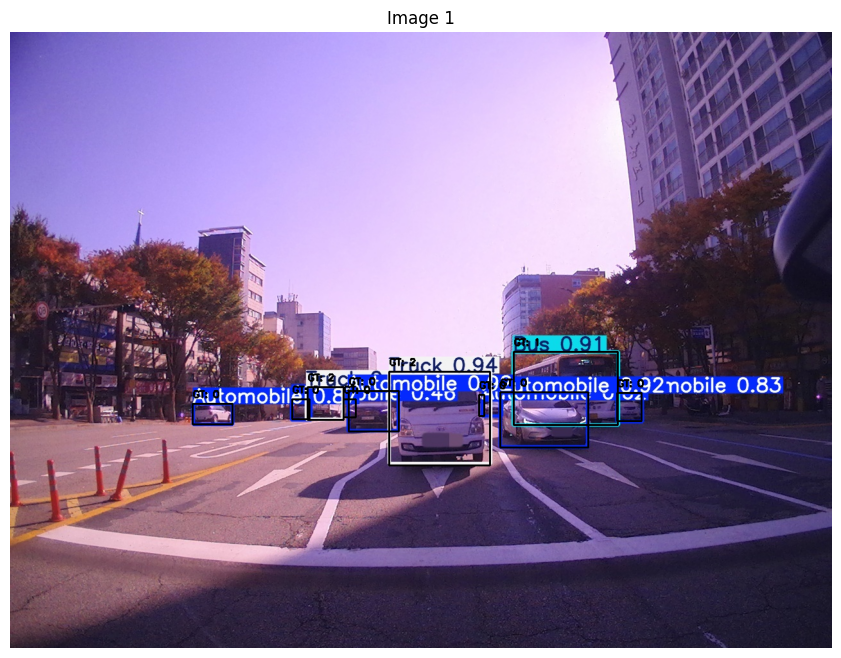


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance/predict/CityData_Fr_2022-10-25-10-07-32_22_0294.jpg: 480x640 4 Automobiles, 1 Bus, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


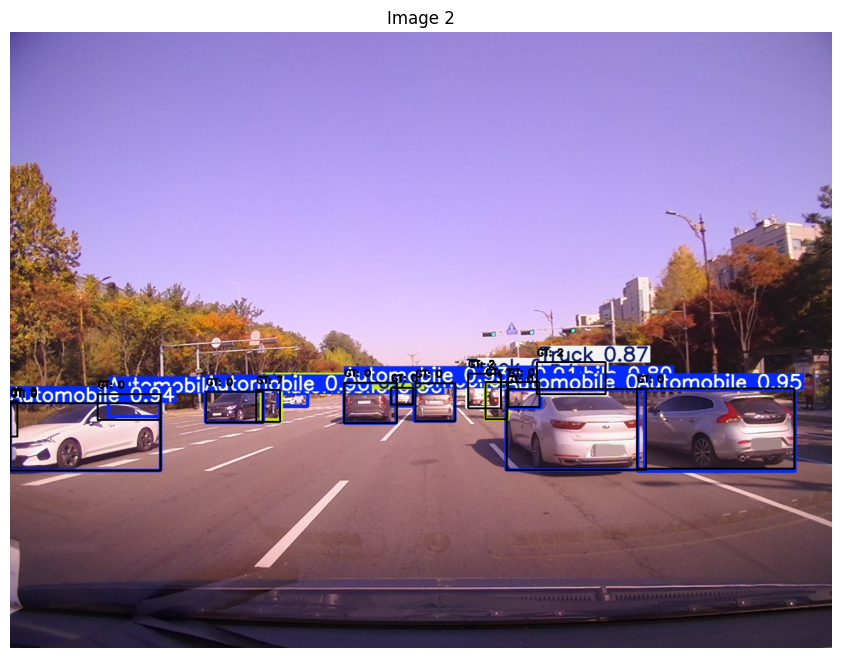


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance/predict/CityData_Re_2022-10-25-09-59-11_11_0395.jpg: 480x640 2 Buss, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


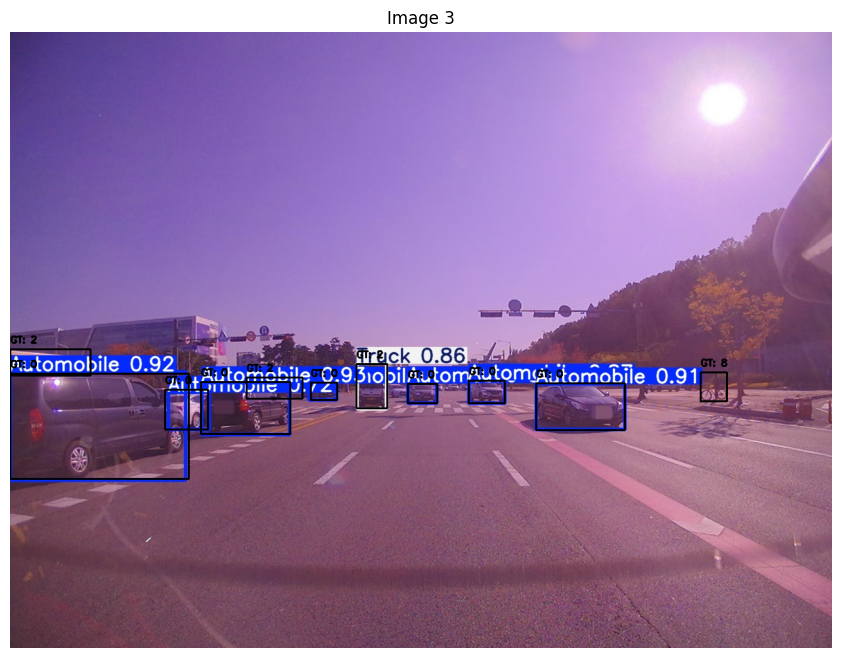


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance/predict/CityData_Fr_2022-10-25-10-00-42_13_0280.jpg: 480x640 1 Automobile, 2 Buss, 1 Truck, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


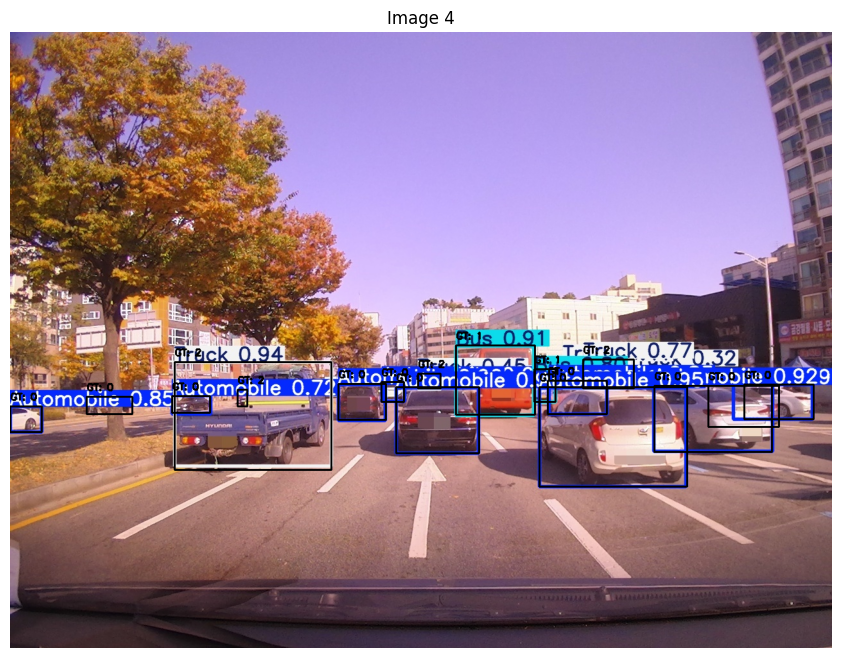


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance/predict/CityData_Re_2022-10-25-10-07-32_22_0320.jpg: 480x640 1 Automobile, 1 Bus, 1 Truck, 8.2ms
Speed: 2.1ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


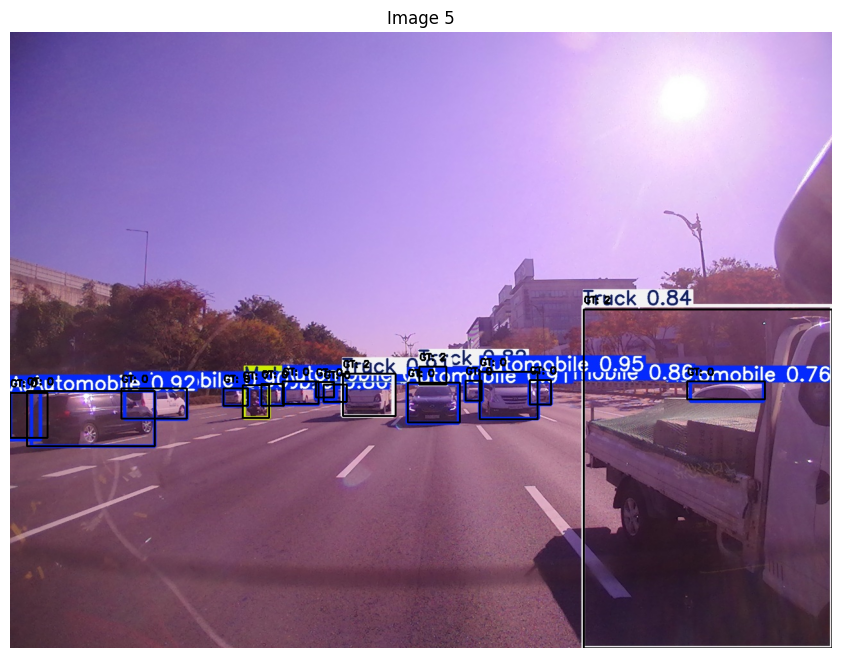


image 1/1 /content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance/predict/CityData_Re_2022-10-25-10-06-47_21_0205.jpg: 480x640 3 Automobiles, 1 Bus, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


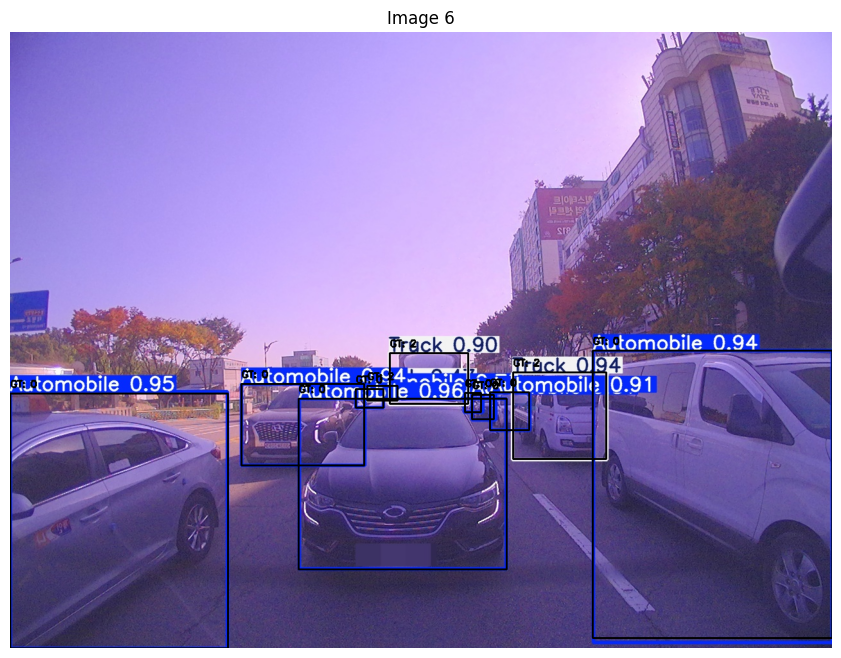

In [ ]:
import cv2
import matplotlib.pyplot as plt

def load_gt_from_txt(txt_path, image_width, image_height):
    """
    YOLO 포맷의 Ground Truth 데이터를 읽어서 절대 좌표로 변환.
    :param txt_path: TXT 파일 경로
    :param image_width: 이미지 너비
    :param image_height: 이미지 높이
    :return: [(x1, y1, x2, y2, class_id), ...] 형태의 리스트
    """
    gt_boxes = []
    if not os.path.exists(txt_path):
        print(f"GT file not found: {txt_path}")
        return gt_boxes  # 빈 리스트 반환

    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            x1 = int((x_center - width / 2) * image_width)
            y1 = int((y_center - height / 2) * image_height)
            x2 = int((x_center + width / 2) * image_width)
            y2 = int((y_center + height / 2) * image_height)
            gt_boxes.append((x1, y1, x2, y2, int(class_id)))
    return gt_boxes

def visualize_gt_and_predictions(image_path, gt_boxes, result):
    """
    GT와 예측을 함께 시각화
    :param image_path: 이미지 파일 경로
    :param gt_boxes: Ground Truth 바운딩 박스 리스트 [(x1, y1, x2, y2, class_id), ...]
    :param result: YOLOv8 모델의 예측 결과 객체
    :return: 시각화된 이미지
    """
    img = cv2.imread(image_path)

    # Ground Truth 바운딩 박스 시각화
    for gt_box in gt_boxes:
        x1, y1, x2, y2, gt_label = map(int, gt_box)
        color = (0, 0, 0)  # 검정색
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        cv2.putText(img, f"GT: {gt_label}",
                    (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # 모델 예측 바운딩 박스 시각화
    if result.boxes.xyxy is not None:  # 예측 결과가 있는 경우
        for box in result.boxes.xyxy:
            if len(box) < 6:
                continue

            x1, y1, x2, y2 = map(int, box[:4])
            confidence = box[4].item()  # confidence score
            pred_label = int(box[5].item())  # 예측 클래스 라벨

            # 클래스별 색상 가져오기
            color = class_colors[pred_label]
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img, f"Pred: {pred_label}, Conf: {confidence:.2f}",
                        (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return img

# 경로에서 랜덤으로 이미지 선택
val_images_dir = '/content/drive/MyDrive/object detection datasets/citydata/finemodel/test performance/predict'
val_images = random.sample(os.listdir(val_images_dir), 6)   # 6장

for idx, image_file in enumerate(val_images, 1):
    # 이미지 경로
    image_path = os.path.join(val_images_dir, image_file)

    # GT 경로 (확장자를 .txt로 변경하여 다른 디렉토리에서 찾음)
    txt_file = os.path.splitext(image_file)[0] + ".txt"  # 파일 이름 동일, 확장자만 .txt
    txt_path = os.path.join('/content/drive/MyDrive/object detection datasets/citydata/dataset/labels/test', txt_file)

    # 이미지 크기 가져오기
    image = cv2.imread(image_path)
    image_height, image_width = image.shape[:2]

    # GT 로드
    gt_boxes = load_gt_from_txt(txt_path, image_width, image_height)

    # 모델 예측 결과
    result = model.predict(source=image_path, save=False)[0]

    # 시각화된 이미지 반환 (GT + 예측)
    result_img = visualize_gt_and_predictions(image_path, gt_boxes, result)

    # 개별적으로 큰 이미지 출력
    plt.figure(figsize=(12, 8))  # 큰 이미지 크기 설정
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")  # 축 제거
    plt.title(f"Image {idx}")  # 제목 추가
    plt.show()


## 결과 해석

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import pandas as pd

data = pd.read_csv('/content/drive/MyDrive/object detection datasets/citydata/finemodel/custom_yolo/results.csv')

data.tail()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
95,96,4514.30,0.57127,0.34392,0.84980,0.77592,0.70317,0.75338,0.55996,0.54883,0.33186,0.84420,0.000595,0.000595,0.000595
96,97,4559.98,0.56591,0.34007,0.84972,0.78181,0.70678,0.75813,0.56272,0.54757,0.33026,0.84378,0.000496,0.000496,0.000496
97,98,4606.47,0.56241,0.33633,0.84717,0.77888,0.69653,0.75529,0.55939,0.54661,0.32919,0.84318,0.000397,0.000397,0.000397
98,99,4652.04,0.55738,0.33251,0.84711,0.75055,0.70129,0.75091,0.55848,0.54584,0.32836,0.84284,0.000298,0.000298,0.000298
99,100,4698.36,0.55331,0.32998,0.84545,0.77116,0.69331,0.73918,0.55415,0.54511,0.32766,0.84257,0.000199,0.000199,0.000199


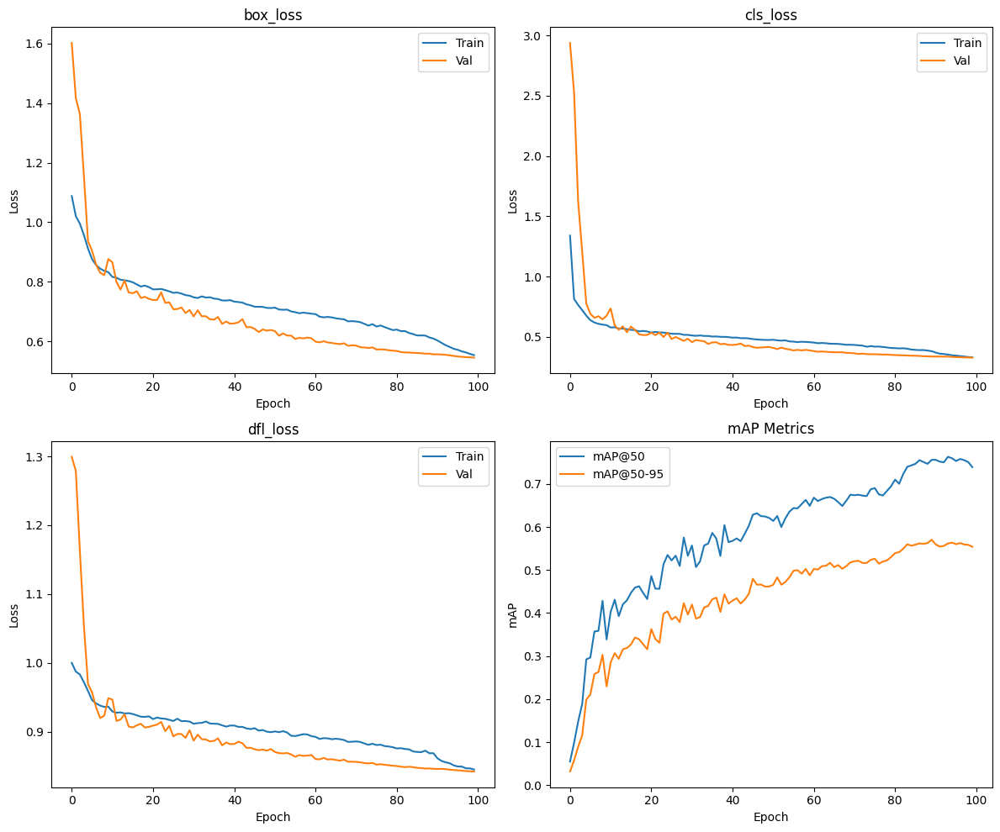

In [ ]:
# 묶을 컬럼 그룹 정의
loss_columns = [
    ("train/box_loss", "val/box_loss"),
    ("train/cls_loss", "val/cls_loss"),
    ("train/dfl_loss", "val/dfl_loss")
]

metrics_columns = [
    ("metrics/mAP50(B)", "metrics/mAP50-95(B)")
]

# 플롯
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

# Train/Val Loss 플롯
for i, (train_col, val_col) in enumerate(loss_columns):
    axes[i].plot(data[train_col], label="Train")
    axes[i].plot(data[val_col], label="Val")
    axes[i].set_title(train_col.split('/')[1])  # "box_loss", "cls_loss", "dfl_loss"
    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("Loss")
    axes[i].legend()

# mAP Metrics 플롯
for j, (mAP50_col, mAP95_col) in enumerate(metrics_columns, start=len(loss_columns)):
    axes[j].plot(data[mAP50_col], label="mAP@50")
    axes[j].plot(data[mAP95_col], label="mAP@50-95")
    axes[j].set_title("mAP Metrics")
    axes[j].set_xlabel("Epoch")
    axes[j].set_ylabel("mAP")
    axes[j].legend()

# 레이아웃 조정
plt.tight_layout()
plt.show()
